# Model 2 — Discriminative suitability: from prototypes to linear probes

## Where we are in the research plan

In `Embedding_Similarity_Search.ipynb` (Model 1) we asked: *do the AlphaEarth (AEF) embeddings of
future solar sites form a compact cluster we can find with a mean "prototype" vector?* The answer was
**no**: cosine similarity to the mean solar embedding scored **ROC-AUC ≈ 0.57, PR-AUC ≈ 0.023**
(barely above the 0.018 chance baseline). The diagnosis: land that later becomes solar looks, on
average, very similar to the land right next to it — `cos(mean_solar, mean_background) ≈ 0.85`.
The information we need is **discriminative** (what separates chosen land from *unchosen* land),
not **generative** (what solar land looks like in isolation).

## What this notebook does

We now bring in the **true negative chips**: globally distributed random areas, country-stratified to
match the positive distribution, and **≥ 5 km from any known solar site of any year**. These represent
"land where solar was *not* built" — our stand-in for unsuitable (or at least unchosen) land.

Two competing hypotheses for the **positive** signal (both tested):

1. **Masked-only** — only the pixels inside the solar-site footprint mask carry the "suitable" signal.
2. **Whole-chip** — the entire positive image is "good area": a chosen site's *surroundings*
   (access, terrain, land use) are part of what made it viable, so every pixel in a positive chip
   is a (noisy) positive.

## The ladder of linear scorers

Every model in this notebook scores a pixel the same way: **score(x) = w · x** — a weighted sum of
the 64 embedding dimensions. They differ only in *how the weight vector w is chosen*:

| rung | scorer | w = | how it's obtained |
|---|---|---|---|
| 0 | cosine prototype (Model 1) | `unit(μ₊)` | formula (no negatives used) |
| 1 | **mean-embedding contrast** | `μ₊ − μ₋` | formula |
| 2 | **LDA** (Fisher discriminant) | `Σ⁻¹(μ₊ − μ₋)` | formula, uses covariance |
| 3 | **logistic linear probe** | learned | optimisation on labelled pixels |

The key insight: *the mean-embedding contrast IS a linear probe whose weights we wrote down by
formula instead of learning them.* Rung 3 can only do better (or equal) than rung 1 because it
searches over all possible w, including rung 1's choice. Section 5 explains the maths and shows a
2-D picture of why the rungs differ. Because all of them reduce to a weighted band-sum, **any** of
them can later be deployed directly inside Google Earth Engine for country-scale maps.

## How we evaluate (three tasks)

1. **Pixel suitability** (the headline task): score solar-destined pixels from *held-out* positive
   scenes vs pixels from *held-out* negative chips. Metrics: ROC-AUC and PR-AUC (see the metric
   explainer in the Model 1 notebook).
2. **Chip-level**: average the embedding over a whole chip, score it, and classify positive scene vs
   negative scene — "would this 2.5 km square be flagged as promising at all?"
3. **Within-chip contrast** (diagnostic only): solar pixels vs same-chip background. This tells us
   whether a scorer distinguishes the footprint from its own context — useful to *interpret* what the
   scorer learned, but background context is **not** treated as a negative label anywhere in training.

## Honesty caveats (read before trusting numbers)

- Negatives are **presumed** unsuitable. The 5 km rule guarantees they aren't near known solar, but
  some are surely perfectly buildable land that simply wasn't chosen. That label noise puts a ceiling
  on achievable scores — a "mistake" on genuinely suitable negative land is not really a mistake.
  (Positive-unlabelled learning, later in the plan, addresses exactly this.)
- ~32% of positive scenes contain an **already-built, unmasked** solar farm somewhere in the image
  (sites installed 2017–18 predate the AEF window and were excluded from `base_train`, so they were
  never rasterised into masks — investigated 2026-07-07). Those pixels pollute the *background* of
  some positive chips, not the masked positives themselves (that contamination mode was checked and
  is exactly zero). A 3-class mask rebuild is a planned future task.


## 1 · Setup

Paths, imports, and the two split tables. The positive split is scene-level and country-stratified
(built for Model 1); the negative split mirrors its ~20% test fraction, stratified by country so
every country contributes proportionally to both train and test.

In [1]:
import os, time, io, numpy as np, pandas as pd, rasterio
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor

os.chdir(os.path.expanduser("~/Solar_Workspace"))   # data root (GWS symlink)
D    = 64                                            # AEF embedding dimensions
PCH  = "Data/aef_solar_chips/positives/chips"        # positive 256x256x64 chips
PMK  = "Data/aef_solar_chips/positives/masks"        # binary masks (1 = future solar)
NCH  = "Data/aef_solar_chips/negatives/chips"        # true-negative chips

pos = pd.read_csv("Solar-Siting/artifacts/splits/emb_search_split.csv")   # chip,country,year,scene,split
neg = pd.read_csv("Solar-Siting/artifacts/splits/emb_neg_split.csv")      # file,country,year,split

print(f"positive chips: {len(pos):,} ({pos[pos.split=='train'].shape[0]:,} train / "
      f"{pos[pos.split=='test'].shape[0]:,} test), {pos.country.nunique()} countries")
print(f"negative chips: {len(neg):,} ({neg[neg.split=='train'].shape[0]:,} train / "
      f"{neg[neg.split=='test'].shape[0]:,} test), {neg.country.nunique()} countries")

positive chips: 82,148 (65,985 train / 16,163 test), 131 countries
negative chips: 8,186 (6,580 train / 1,606 test), 89 countries


## 2 · Sanity check — what do the negative chips look like?

Each negative is a single 256×256 centre-crop of a randomly placed export (country-stratified,
≥ 5 km from any solar site of any year, embedding year matched to the positive year distribution).
Before using them we confirm: (a) they load as (64, 256, 256) float arrays, (b) their embeddings are
unit-norm like the positives (so cosine = dot product still holds), and (c) they *look* like ordinary
land in a pseudo-RGB rendering of the first three embedding bands — no obvious artefacts, no solar.

One quirk found while building this notebook: **some negative chips contain NaN pixels.** AEF simply
has no data over water and a few other uncovered surfaces, and negatives are placed *randomly*, so
some land on coastlines or lakes (positives never have this problem — a solar site guarantees land
with coverage). Every reader below therefore drops non-finite pixels before using a chip.

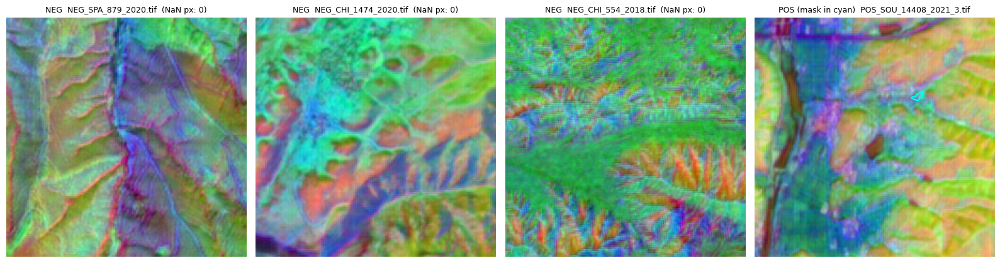

negative embedding norms: mean=1.0001  sd=0.0020  -> unit-norm, same as positives


In [2]:
def pseudo_rgb(arr):
    "First 3 embedding bands, min-max scaled per band (NaN-safe). NOT real colour - just texture."
    rgb = arr[:3].transpose(1, 2, 0)
    lo, hi = np.nanmin(rgb, axis=(0, 1)), np.nanmax(rgb, axis=(0, 1))
    return np.nan_to_num((rgb - lo) / (hi - lo + 1e-9), nan=1.0)   # NaN renders white

rng = np.random.default_rng(7)
show_neg = neg.sample(3, random_state=7).file.tolist()
show_pos = pos[pos.split == "test"].sample(1, random_state=7).chip.iloc[0]

fig, axes = plt.subplots(1, 4, figsize=(16, 4.2))
norms = []
for ax, f in zip(axes[:3], show_neg):
    with rasterio.open(os.path.join(NCH, f)) as src:
        a = src.read().astype(np.float32)
    n_nan = int((~np.isfinite(a)).any(axis=0).sum())
    norms.append(np.linalg.norm(a[:, np.isfinite(a).all(axis=0)], axis=0))
    ax.imshow(pseudo_rgb(a)); ax.set_title(f"NEG  {f}  (NaN px: {n_nan})", fontsize=9); ax.axis("off")
with rasterio.open(os.path.join(PCH, show_pos)) as src:
    a = src.read().astype(np.float32)
with rasterio.open(os.path.join(PMK, show_pos)) as src:
    m = src.read(1)
axes[3].imshow(pseudo_rgb(a))
axes[3].contour(m, levels=[0.5], colors="cyan", linewidths=1.5)
axes[3].set_title(f"POS (mask in cyan)  {show_pos}", fontsize=9); axes[3].axis("off")
plt.tight_layout(); plt.show()

nn = np.concatenate([n.ravel() for n in norms])   # finite pixels only
print(f"negative embedding norms: mean={nn.mean():.4f}  sd={nn.std():.4f}  -> unit-norm, same as positives")

## 3 · Country balance of positives vs negatives

The negatives were *sampled* to match the positive country distribution, but the download is still in
progress, so we check how well the two distributions currently line up. Strong mismatch would mean a
scorer could "cheat" by learning country-specific looks rather than suitability. (Codes are the
3-letter filename prefixes.)

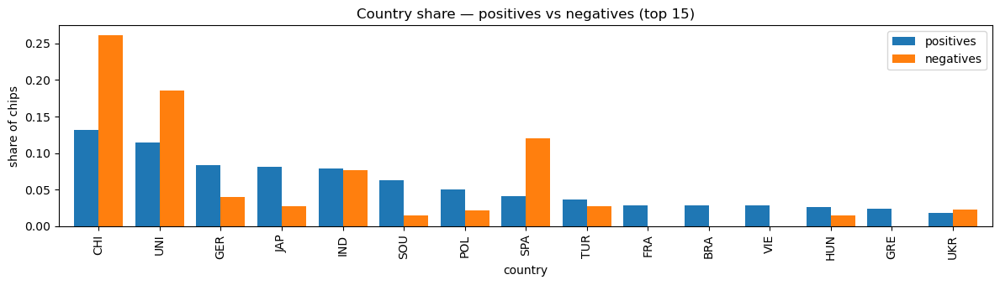

countries with positives but zero negatives so far: 42


In [3]:
pos_share = pos.country.value_counts(normalize=True)
neg_share = neg.country.value_counts(normalize=True)
top = pos_share.head(15).index
cmp = pd.DataFrame({"positives": pos_share[top], "negatives": neg_share.reindex(top).fillna(0)})
ax = cmp.plot.bar(figsize=(12, 3.5), width=0.8)
ax.set_ylabel("share of chips"); ax.set_title("Country share — positives vs negatives (top 15)")
plt.tight_layout(); plt.show()
print("countries with positives but zero negatives so far:",
      int((~pos_share.index.isin(neg_share.index)).sum()))

## 4 · Streaming statistics over the training chips

We need, for each pixel population (solar-masked, positive-chip background, true negative):

- the **mean** embedding μ (for the centroid-contrast scorers),
- the **covariance** Σ (for LDA),
- a **random sample of raw pixels** (logistic regression needs actual rows, not just summaries).

Reading ~10k chips × 65k pixels × 64 dims is far too big for memory, so we stream: per chip we keep
only the running **sum** `s = Σx`, the **sum of outer products** `O = Σxxᵀ`, and the pixel counts.
Then `μ = s/n` and `Σ = O/n − μμᵀ` — mathematically exact, constant memory. Sums are kept in float64
so billions of small additions don't lose precision. The **whole-chip** mean needs no extra pass:
`μ_whole = (s_solar + s_background) / (n_solar + n_background)`.

Reads are parallelised with 8 threads (I/O-bound — ~6× faster than serial; this cell is the slow one,
~6–8 min for 3,000 positive + 6,580 negative chips).

In [4]:
pos_train = pos[pos.split == "train"].sample(3000, random_state=1)  # same subsample as Model 1
neg_train = neg[neg.split == "train"]

def read_pos(fn, k_solar=150, k_all=150):
    "One positive chip -> (solar stats, background stats, pixel samples)."
    r = np.random.default_rng(abs(hash(fn)) % (2**32))
    with rasterio.open(os.path.join(PCH, fn)) as src:
        flat = src.read().astype(np.float32).reshape(D, -1).T      # (65536, 64)
    with rasterio.open(os.path.join(PMK, fn)) as m:
        sm = (m.read(1) > 0).reshape(-1)
    S, B = flat[sm], flat[~sm]
    n, bn = len(S), len(B)
    s  = S.sum(0, dtype=np.float64) if n else np.zeros(D)
    o  = (S.T.astype(np.float64) @ S) if n else np.zeros((D, D))
    bs = B.sum(0, dtype=np.float64) if bn else np.zeros(D)
    bo = (B.T.astype(np.float64) @ B) if bn else np.zeros((D, D))
    rs = S[r.choice(n, min(n, k_solar), replace=False)] if n else np.zeros((0, D), np.float32)
    ra = flat[r.choice(len(flat), k_all, replace=False)]           # uniform over whole chip
    return n, s, o, bn, bs, bo, rs, ra

def read_neg(fn, k=200):
    r = np.random.default_rng(abs(hash(fn)) % (2**32))
    with rasterio.open(os.path.join(NCH, fn)) as src:
        flat = src.read().astype(np.float32).reshape(D, -1).T
    flat = flat[np.isfinite(flat).all(axis=1)]        # drop AEF nodata (water etc.)
    if len(flat) == 0:
        return 0, np.zeros(D), np.zeros((D, D)), np.zeros((0, D), np.float32)
    return (len(flat), flat.sum(0, dtype=np.float64),
            flat.T.astype(np.float64) @ flat,
            flat[r.choice(len(flat), min(len(flat), k), replace=False)])

STATS = "Solar-Siting/artifacts/stats/emb_disc_stats.npz"
if os.path.exists(STATS):
    z = dict(np.load(STATS))
    print("loaded cached statistics from", STATS)
else:
    t0 = time.time()
    A = dict(n=0, s=np.zeros(D), o=np.zeros((D, D)), bn=0, bs=np.zeros(D), bo=np.zeros((D, D)))
    RS, RA = [], []
    with ThreadPoolExecutor(max_workers=8) as ex:
        for i, (n, s, o, bn, bs, bo, rs, ra) in enumerate(ex.map(read_pos, pos_train.chip)):
            A['n'] += n; A['s'] += s; A['o'] += o
            A['bn'] += bn; A['bs'] += bs; A['bo'] += bo
            if len(rs): RS.append(rs)
            RA.append(ra)
            if (i + 1) % 1000 == 0: print(f"  pos {i+1}/{len(pos_train)}  {time.time()-t0:.0f}s", flush=True)
    N = dict(n=0, s=np.zeros(D), o=np.zeros((D, D))); RN = []
    with ThreadPoolExecutor(max_workers=8) as ex:
        for i, (n, s, o, rr) in enumerate(ex.map(read_neg, neg_train.file)):
            N['n'] += n; N['s'] += s; N['o'] += o; RN.append(rr)
            if (i + 1) % 2000 == 0: print(f"  neg {i+1}/{len(neg_train)}  {time.time()-t0:.0f}s", flush=True)
    z = dict(n_s=A['n'], s_s=A['s'], o_s=A['o'], n_b=A['bn'], s_b=A['bs'], o_b=A['bo'],
             n_n=N['n'], s_n=N['s'], o_n=N['o'],
             res_pos_masked=np.concatenate(RS), res_pos_all=np.concatenate(RA),
             res_neg=np.concatenate(RN))
    np.savez(STATS, **z)
    print(f"accumulated + saved in {time.time()-t0:.0f}s")

print(f"solar px: {int(z['n_s']):,} | pos-background px: {int(z['n_b']):,} | negative px: {int(z['n_n']):,}")
print(f"pixel samples for probes: masked {z['res_pos_masked'].shape}, "
      f"whole-chip {z['res_pos_all'].shape}, negative {z['res_neg'].shape}")

loaded cached statistics from Solar-Siting/artifacts/stats/emb_disc_stats.npz
solar px: 2,979,671 | pos-background px: 193,628,329 | negative px: 430,958,191
pixel samples for probes: masked (322118, 64), whole-chip (450000, 64), negative (1315200, 64)


## 4b · First look: are the class means even different?

Before training anything, the cheapest possible question: how far apart are the mean embeddings?
In Model 1 the killer number was `cos(μ_solar, μ_background) ≈ 0.85` — nearly parallel means. If
`cos(μ_solar, μ_negative)` is *lower* than that, the true negatives give us more contrast to work
with than the within-chip background did, and the discriminative approach has room to succeed.

In [5]:
def cov_from(o, s, n):
    mu = s / n
    return o / n - np.outer(mu, mu), mu

cov_s, mu_s = cov_from(z["o_s"], z["s_s"], z["n_s"])                  # masked solar
cov_b, mu_b = cov_from(z["o_b"], z["s_b"], z["n_b"])                  # pos-chip background
cov_w, mu_w = cov_from(z["o_s"] + z["o_b"], z["s_s"] + z["s_b"], z["n_s"] + z["n_b"])  # whole chip
cov_n, mu_n = cov_from(z["o_n"], z["s_n"], z["n_n"])                  # true negatives

unit = lambda v: v / np.linalg.norm(v)
cosd = lambda a, b: float(np.dot(unit(a), unit(b)))
print("cosine between class means (1.0 = identical direction):")
print(f"  solar      vs background : {cosd(mu_s, mu_b):.4f}   (Model 1's problem)")
print(f"  solar      vs negative   : {cosd(mu_s, mu_n):.4f}")
print(f"  whole chip vs negative   : {cosd(mu_w, mu_n):.4f}")
print(f"\nmean-vector lengths (short = class is spread widely over the sphere):")
print(f"  ||mu_solar||={np.linalg.norm(mu_s):.3f}  ||mu_whole||={np.linalg.norm(mu_w):.3f}  "
      f"||mu_neg||={np.linalg.norm(mu_n):.3f}")

cosine between class means (1.0 = identical direction):
  solar      vs background : 0.8487   (Model 1's problem)
  solar      vs negative   : 0.8357
  whole chip vs negative   : 0.8671

mean-vector lengths (short = class is spread widely over the sphere):
  ||mu_solar||=0.398  ||mu_whole||=0.420  ||mu_neg||=0.334


## 5 · The maths: centroid difference vs LDA vs logistic probe

All three produce a direction **w** and score pixels by the projection `w · x`. Intuition for each:

**Rung 1 — centroid difference, `w = μ₊ − μ₋`.** Walk from the average negative to the average
positive; score by how far along that walk a pixel sits. Equivalent to "nearest class centroid".
Implicit assumption: both classes are round blobs of the same size. Costs two means.

**Rung 2 — LDA, `w = Σ⁻¹(μ₊ − μ₋)`.** Real classes aren't round: some embedding dimensions vary
wildly *within* a class (they're noisy → should count less), and dimensions are correlated (two
correlated dimensions half-duplicate each other's evidence). Multiplying by the inverse pooled
covariance `Σ⁻¹` ("whitening") rescales and de-correlates so that each unit of distance means the
same amount of evidence in every direction. This is the optimal linear rule *if* both classes are
Gaussian with the same covariance. One caveat for AEF: because embeddings live on the unit sphere,
Σ is nearly singular (there is ~zero variance in the radial direction), so we add a small ridge
`εI` before inverting — standard regularisation.

**Rung 3 — logistic probe, w learned.** Drop all distribution assumptions. Model
`P(positive | x) = sigmoid(w · x + b)` and pick w to maximise the likelihood of the labelled training
pixels. This directly optimises separation, so it can exploit structure the formulas miss — but it
needs actual labelled pixel rows and an optimiser rather than two sufficient statistics.

The 2-D toy below shows *why* the rungs differ: with elongated, correlated classes the centroid
direction (red) is visibly wrong — points far along the long axis get misranked — while LDA (green)
and logistic (blue, dashed) tilt to compensate and nearly coincide.

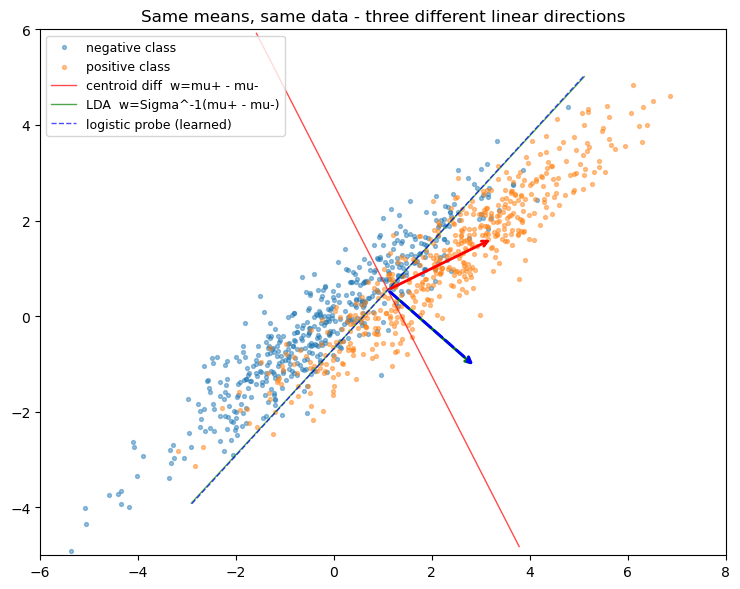

cos(centroid, LDA) in this toy: 0.366   |   cos(LDA, logistic): 1.000


In [6]:
r2 = np.random.default_rng(0)
mA, mB = np.array([0.0, 0.0]), np.array([2.2, 1.1])
Csh = np.array([[3.0, 2.4], [2.4, 2.2]])                      # shared, strongly correlated
L = np.linalg.cholesky(Csh)
A2 = r2.standard_normal((500, 2)) @ L.T + mA
B2 = r2.standard_normal((500, 2)) @ L.T + mB

w_diff = mB - mA
w_lda  = np.linalg.solve(Csh, mB - mA)
from sklearn.linear_model import LogisticRegression
lr2 = LogisticRegression().fit(np.r_[A2, B2], np.r_[np.zeros(500), np.ones(500)])
w_log = lr2.coef_[0]

fig, ax = plt.subplots(figsize=(7.5, 6))
ax.scatter(*A2.T, s=8, alpha=.45, label="negative class")
ax.scatter(*B2.T, s=8, alpha=.45, label="positive class")
mid = (mA + mB) / 2
for w, c, ls, lab in [(w_diff, "red", "-", "centroid diff  w=mu+ - mu-"),
                      (w_lda, "green", "-", "LDA  w=Sigma^-1(mu+ - mu-)"),
                      (w_log, "blue", "--", "logistic probe (learned)")]:
    wu = w / np.linalg.norm(w)
    ax.annotate("", xy=mid + 2.4*wu, xytext=mid,
                arrowprops=dict(arrowstyle="->", color=c, lw=2, ls=ls))
    p = np.array([-wu[1], wu[0]])                              # decision boundary _|_ to w
    ax.plot(*np.c_[mid - 6*p, mid + 6*p], color=c, lw=1, ls=ls, alpha=.7, label=lab)
ax.set_xlim(-6, 8); ax.set_ylim(-5, 6); ax.legend(fontsize=9)
ax.set_title("Same means, same data - three different linear directions")
plt.tight_layout(); plt.show()
print(f"cos(centroid, LDA) in this toy: {np.dot(w_diff, w_lda)/np.linalg.norm(w_diff)/np.linalg.norm(w_lda):.3f}"
      f"   |   cos(LDA, logistic): {np.dot(w_lda, w_log)/np.linalg.norm(w_lda)/np.linalg.norm(w_log):.3f}")

## 6 · Build all seven scorers on the real data

Closed-form rungs from the streamed statistics; logistic probes trained on the sampled pixel rows
(`class_weight='balanced'` so the larger negative sample doesn't dominate the loss). We finish with
the cosine similarity *between the weight vectors themselves* — if a learned probe ends up nearly
parallel to the centroid difference, learning bought little; a low cosine means it found a genuinely
different direction.

In [7]:
EPS = 1e-4
def lda_w(mu_pos, cov_pos, n_pos):
    pooled = (n_pos * cov_pos + z["n_n"] * cov_n) / (n_pos + z["n_n"])
    return unit(np.linalg.solve(pooled + EPS * np.eye(D), mu_pos - mu_n))

W = {
    "w1_cosine_proto": unit(mu_s),                # Model 1 carried over (no negatives used)
    "w2_diff_masked":  unit(mu_s - mu_n),         # Abdullah's variant A: masked solar vs negatives
    "w3_diff_whole":   unit(mu_w - mu_n),         # Abdullah's variant B: whole pos chip vs negatives
    "w4_lda_masked":   lda_w(mu_s, cov_s, z["n_s"]),
    "w5_lda_whole":    lda_w(mu_w, cov_w, z["n_s"] + z["n_b"]),
}

def probe(X_pos, name):
    X = np.concatenate([X_pos, z["res_neg"]]).astype(np.float32)
    y = np.concatenate([np.ones(len(X_pos)), np.zeros(len(z["res_neg"]))])
    t0 = time.time()
    clf = LogisticRegression(max_iter=2000, class_weight="balanced", C=1.0).fit(X, y)
    print(f"  {name}: fitted on {X.shape[0]:,} pixels in {time.time()-t0:.0f}s")
    return unit(clf.coef_[0])

W["w6_probe_masked"] = probe(z["res_pos_masked"], "probe masked-vs-neg")
W["w7_probe_whole"]  = probe(z["res_pos_all"],   "probe whole-vs-neg")
np.savez("Solar-Siting/artifacts/models/emb_disc_weights.npz", **W)

names = list(W)
sim = pd.DataFrame([[cosd(W[a], W[b]) for b in names] for a in names],
                   index=names, columns=[n[3:12] for n in names])
print("\ncosine similarity between weight directions:")
print(sim.round(3).to_string())

  probe masked-vs-neg: fitted on 1,637,318 pixels in 14s


  probe whole-vs-neg: fitted on 1,765,200 pixels in 12s

cosine similarity between weight directions:
                 cosine_pr  diff_mask  diff_whol  lda_maske  lda_whole  probe_mas  probe_who
w1_cosine_proto      1.000      0.545      0.375      0.414      0.387      0.395      0.348
w2_diff_masked       0.545      1.000      0.463      0.572      0.341      0.514      0.362
w3_diff_whole        0.375      0.463      1.000      0.263      0.544      0.454      0.540
w4_lda_masked        0.414      0.572      0.263      1.000      0.620      0.766      0.587
w5_lda_whole         0.387      0.341      0.544      0.620      1.000      0.835      0.952
w6_probe_masked      0.395      0.514      0.454      0.766      0.835      1.000      0.859
w7_probe_whole       0.348      0.362      0.540      0.587      0.952      0.859      1.000


## 7 · Held-out evaluation

1,200 positive test chips (scene-level held out — no chip from a training scene) and all 1,606
negative test chips. Per chip we sample up to 300 pixels per class and also keep the whole-chip mean
embedding for the chip-level task. Baselines to beat: pixel PR-AUC baseline = positive share of the
pixel pool; chip PR-AUC baseline = positive share of chips. ROC-AUC baseline is always 0.5.

In [8]:
from sklearn.metrics import roc_auc_score, average_precision_score

pos_test = pos[pos.split == "test"].sample(1200, random_state=2)
neg_test = neg[neg.split == "test"]

def read_pos_eval(fn, k=300):
    r = np.random.default_rng(abs(hash(fn)) % (2**32))
    with rasterio.open(os.path.join(PCH, fn)) as src:
        flat = src.read().astype(np.float32).reshape(D, -1).T
    with rasterio.open(os.path.join(PMK, fn)) as m:
        sm = (m.read(1) > 0).reshape(-1)
    S, B = flat[sm], flat[~sm]
    rs = S[r.choice(len(S), min(len(S), k), replace=False)] if len(S) else np.zeros((0, D), np.float32)
    rb = B[r.choice(len(B), min(len(B), k), replace=False)] if len(B) else np.zeros((0, D), np.float32)
    return rs, rb, flat.mean(0)

def read_neg_eval(fn, k=300):
    r = np.random.default_rng(abs(hash(fn)) % (2**32))
    with rasterio.open(os.path.join(NCH, fn)) as src:
        flat = src.read().astype(np.float32).reshape(D, -1).T
    flat = flat[np.isfinite(flat).all(axis=1)]        # drop AEF nodata
    if len(flat) == 0:
        return np.zeros((0, D), np.float32), None
    return flat[r.choice(len(flat), min(len(flat), k), replace=False)], flat.mean(0)

t0 = time.time(); PS, PB, PM, NS, NM = [], [], [], [], []
with ThreadPoolExecutor(max_workers=8) as ex:
    for rs, rb, m in ex.map(read_pos_eval, pos_test.chip):
        if len(rs): PS.append(rs)
        if len(rb): PB.append(rb)
        PM.append(m)
with ThreadPoolExecutor(max_workers=8) as ex:
    for rr, m in ex.map(read_neg_eval, neg_test.file):
        if m is not None:
            NS.append(rr); NM.append(m)
X_sol, X_bg, X_neg = np.concatenate(PS), np.concatenate(PB), np.concatenate(NS)
M_pos, M_neg = np.stack(PM), np.stack(NM)
print(f"test reads done in {time.time()-t0:.0f}s | solar px {len(X_sol):,}, "
      f"bg px {len(X_bg):,}, neg px {len(X_neg):,}")

test reads done in 165s | solar px 228,908, bg px 360,000, neg px 481,800


pixel PR baseline = 0.322 | chip PR baseline = 0.428 | ROC baseline = 0.5



,px_ROC,px_PR,chip_ROC,chip_PR,within_ROC
scorer,,,,,
w1_cosine_proto,0.734,0.552,0.667,0.570,0.592
w2_diff_masked,0.761,0.559,0.656,0.558,0.630
w3_diff_whole,0.750,0.551,0.765,0.659,0.498
w4_lda_masked,0.817,0.637,0.738,0.624,0.653
w5_lda_whole,0.812,0.649,0.839,0.778,0.497
w6_probe_masked,0.864,0.731,0.813,0.743,0.628
w7_probe_whole,0.813,0.647,0.841,0.778,0.493


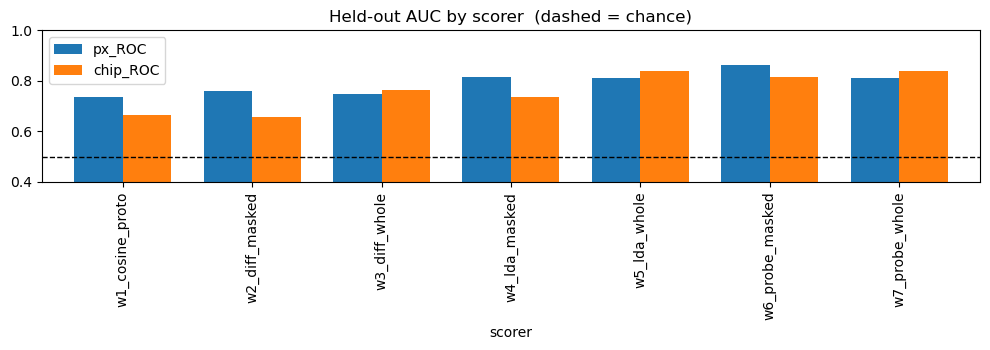

In [9]:
rows = []
for nm, w in W.items():
    s_sol, s_bg, s_neg = X_sol @ w, X_bg @ w, X_neg @ w
    s_mp, s_mn = M_pos @ w, M_neg @ w
    y1, x1 = np.r_[np.ones(len(s_sol)), np.zeros(len(s_neg))], np.r_[s_sol, s_neg]
    y2, x2 = np.r_[np.ones(len(s_mp)), np.zeros(len(s_mn))], np.r_[s_mp, s_mn]
    y3, x3 = np.r_[np.ones(len(s_sol)), np.zeros(len(s_bg))], np.r_[s_sol, s_bg]
    rows.append(dict(scorer=nm,
                     px_ROC=roc_auc_score(y1, x1), px_PR=average_precision_score(y1, x1),
                     chip_ROC=roc_auc_score(y2, x2), chip_PR=average_precision_score(y2, x2),
                     within_ROC=roc_auc_score(y3, x3)))
res = pd.DataFrame(rows).set_index("scorer")
res.to_csv("Solar-Siting/artifacts/results/emb_disc_results.csv")
print(f"pixel PR baseline = {len(X_sol)/(len(X_sol)+len(X_neg)):.3f} | "
      f"chip PR baseline = {len(M_pos)/(len(M_pos)+len(M_neg)):.3f} | ROC baseline = 0.5\n")
display(res.round(3))

ax = res[["px_ROC", "chip_ROC"]].plot.bar(figsize=(10, 3.6), width=0.75)
ax.axhline(0.5, color="k", lw=1, ls="--"); ax.set_ylim(0.4, 1.0)
ax.set_title("Held-out AUC by scorer  (dashed = chance)"); plt.tight_layout(); plt.show()

## 8 · Visual check — suitability heatmaps

Numbers can hide silly behaviour, so we look. Each row is one held-out chip (two positive scenes —
including the Bhadla sanity chip from the Model 1 notebook — and one true negative). Columns compare
scorers. All maps share a **fixed colour scale per scorer** (2nd–98th percentile of that scorer over
all test pixels), so brightness is comparable across rows: a good scorer should light up positive
scenes (especially inside the cyan mask outline) and stay dark on the negative chip.

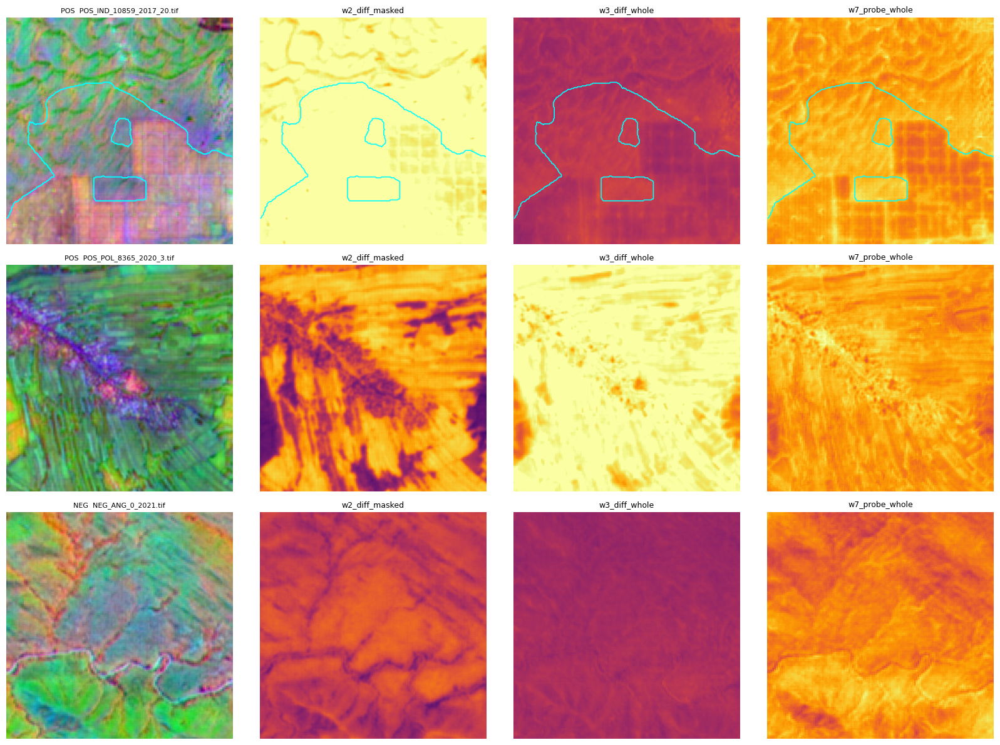

fixed scales per scorer: {'w2_diff_masked': [np.float64(-0.337), np.float64(0.437)], 'w3_diff_whole': [np.float64(-0.316), np.float64(0.573)], 'w7_probe_whole': [np.float64(-0.145), np.float64(0.288)]}


In [10]:
def score_map(fn, w, is_neg=False):
    p = os.path.join(NCH if is_neg else PCH, fn)
    with rasterio.open(p) as src:
        arr = src.read().astype(np.float32)
    sc = np.tensordot(w, arr, axes=(0, 0))
    if is_neg:
        return arr, sc, None
    with rasterio.open(os.path.join(PMK, fn)) as m:
        return arr, sc, m.read(1)

SANITY = "POS_IND_10859_2017_20.tif"
second = pos_test[pos_test.chip != SANITY].sample(1, random_state=11).chip.iloc[0]
one_neg = neg_test.sample(1, random_state=11).file.iloc[0]
panels = [(SANITY, False), (second, False), (one_neg, True)]
show_w = ["w2_diff_masked", "w3_diff_whole", "w7_probe_whole"]
lims = {nm: np.percentile(np.r_[X_sol @ W[nm], X_neg @ W[nm]], [2, 98]) for nm in show_w}

fig, axes = plt.subplots(len(panels), len(show_w) + 1, figsize=(4.1*(len(show_w)+1), 4*len(panels)))
for i, (fn, is_neg) in enumerate(panels):
    arr, _, msk = score_map(fn, W[show_w[0]], is_neg)
    axes[i, 0].imshow(pseudo_rgb(arr))
    if msk is not None: axes[i, 0].contour(msk, levels=[0.5], colors="cyan", linewidths=1.4)
    axes[i, 0].set_title(("NEG  " if is_neg else "POS  ") + fn, fontsize=8)
    for j, nm in enumerate(show_w, start=1):
        _, sc, msk = score_map(fn, W[nm], is_neg)
        im = axes[i, j].imshow(sc, cmap="inferno", vmin=lims[nm][0], vmax=lims[nm][1])
        if msk is not None: axes[i, j].contour(msk, levels=[0.5], colors="cyan", linewidths=1.2)
        axes[i, j].set_title(nm, fontsize=9)
    for ax in axes[i]: ax.axis("off")
plt.tight_layout(); plt.show()
print("fixed scales per scorer:", {k: list(np.round(v, 3)) for k, v in lims.items()})

## 9 · Findings

**The discriminative signal is real, and the ladder behaves exactly as the theory says it should**
(each rung ≥ the one below). Headline numbers from the held-out test (first run, 2026-07-07):

1. **True negatives change the game.** Even the *unchanged* Model-1 cosine prototype scores pixel
   ROC ≈ 0.73 against true negatives (vs ≈ 0.57 on the old within-chip task): future-solar land was
   never distinguishable from its own immediate surroundings, but it *is* distinguishable from
   random far-away land.
2. **Centroid contrasts (μ₊ − μ₋) work but modestly**: pixel ROC ≈ 0.75–0.76 — only ~+0.02 over the
   plain prototype. The class means are still nearly parallel (`cos(μ_solar, μ_neg) ≈ 0.84`), so the
   between-means direction just doesn't contain much of the signal.
3. **Learning the direction is where the value is.** LDA jumps to pixel ROC ≈ 0.82 and the logistic
   probe to **0.86 / PR 0.73** (baseline 0.32). The learned directions are far from the centroid ones
   (cosine 0.36–0.51): the separating information lives in *covariance structure*, not in the means —
   which is precisely why Model 1 had to fail.
4. **Both positive-signal hypotheses win — at different granularities.** The *masked* probe is best
   pixel-by-pixel (0.864), but the *whole-chip* scorers are best at ranking scenes (chip ROC 0.84 /
   PR 0.78, vs 0.81/0.74 masked) and are blind within a chip (within_ROC ≈ 0.50, as trained). So the
   footprint pixels carry the sharpest per-pixel signal, while the surroundings genuinely add
   site-level information — the context hypothesis holds at the scene scale.
5. Practical consequence: for **where-in-the-landscape maps** use the masked probe; for **ranking
   candidate areas** the whole-chip scorer is at least as good and cheaper to label (no masks needed).

Caveats from §0 still apply: negatives are presumed-unsuitable (label noise → these numbers are
conservative), and LDA-whole ≈ probe-whole (weight cosine 0.95) says the Gaussian closed form is
almost enough — useful if we ever want to refit without an optimiser.

## 10 · The real test — country-scale inference (next)

Chip-level metrics compare our positives against *sampled* negatives; the deployment question is
harsher: rank **every pixel in a country** and see whether actual solar build-out lands in the top
scores. Protocol (agreed 2026-07-07):

1. Pick a country with plenty of post-2019 installations.
2. In Google Earth Engine, take the AEF annual embedding image for year *Y* and compute the score as
   a **weighted band sum** with the winning w (all our scorers deploy this way — no model server
   needed).
3. Validate against inventory sites with install year > *Y* (they didn't exist at imaging time):
   report the **percentile of the score** at each site vs. the country-wide score distribution, plus
   a map overlay. Sites installed ≤ *Y* are excluded (their pixels contain built panels).
4. Hard-negative mining (Epoch Blue recipe): the highest-scoring false-positive regions become new
   negatives for the next training round.

### 10a · Greece — 2019 map scored with the 5% masked probe

**Validation design.** We take the AEF annual embedding of **2019** for all of Greece and score every
pixel with the masked linear probe (`w6`) as a weighted band sum computed inside Google Earth Engine —
no data leaves GEE except the sampled points and a 100 m render. We then compare two populations:

- **future solar sites**: one representative point for each inventory site **installed ≥ 2021**.
  The 2-year gap mirrors training (chips are embeddings 2 years pre-install), and guarantees none of
  these sites exist in the 2019 imagery — the map cannot be "detecting panels".
- **random Greek land**: 6,000 points sampled uniformly inside the national polygon.

Both populations are scored identically (chunked `reduceRegions` at the native 10 m — a full-country
`sample()` at 10 m times out because GEE would have to compute every tile; scoring explicit points
only computes the tiles they touch).

**Metrics.** ROC-AUC = probability that a randomly chosen future site outscores a randomly chosen
land point. **Site percentile**: for each future site we compute the fraction of the 6,000 random
land points that score *below* it — its rank in the country-wide score distribution; "median site
percentile 89" therefore reads as *the typical future solar site scores higher than 89% of the
country's land*. The "top X%" lines answer the planner's question directly: *if you only searched the
best-scoring X% of the country, what fraction of actual future build-out would you have found?* —
this is recall at a fixed search budget, the deployment-grade metric here.

**A note on PR-AUC at country scale** (shown on the plots): PR-AUC depends on the positive fraction
of the evaluation sample, and here that fraction (≈ sites / (sites + 6,000 random points) ≈ 0.15–0.25)
is an artefact of how many random points *we chose to sample* — real future-solar land is a far tinier
fraction of a country. So read PR-AUC only against the printed chance level, and only compare it
between runs with the same sampling ratio; the top-X% capture numbers are the honest deployment view.

**Plot axes**: the right-hand histograms use probability *density* (each histogram integrates to 1),
so the 1,080-site and 6,000-point distributions are directly comparable despite their different
sample sizes — raw counts would make the site histogram look misleadingly small.

**Result (first run, 2026-07-07): ROC 0.871, median site percentile 89, 82% of the 1,080 future
sites in the top 20% of scores** (44% in top 10%, 19% in top 5%). The map is geographically sensible:
the agricultural plains of Thessaly, Macedonia and Thrace light up, the Pindus mountains and islands
stay dark. Caveats: random land points may themselves be suitable-but-unbuilt (understates
discrimination), and part of the signal is likely a flat-agricultural-land proxy — the planned
biome/terrain sensitivity analysis will quantify that.

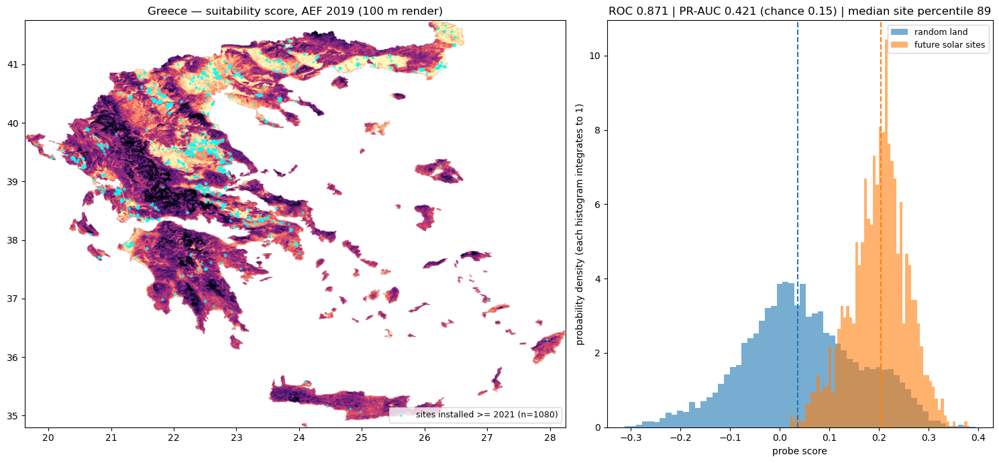

Greece 2019: ROC-AUC 0.871 | PR-AUC 0.421 vs chance 0.15 | median site pct 88.9 | top20% of scores captures 81.9% of sites | top10% of scores captures 44.1% of sites | top5% of scores captures 19.1% of sites


In [11]:
import geopandas as gpd
from shapely.geometry import shape, Point
from PIL import Image
from sklearn.metrics import roc_auc_score

PALETTE = ["000004","2c115f","721f81","b73779","f1605d","feb078","fcfdbf"]   # inferno
GEE_PROJECT = "ee-abdullahr-solar"

def country_scale(country, year, min_install, w, prefix, n_rand=6000):
    '''Whole-country validation of a linear scorer w (cached: loads saved arrays if present).

    Computes in GEE: score = sum_i w_i * band_i of the AEF annual mosaic for `year`,
    sampled at 10 m for (a) every inventory site installed >= min_install and
    (b) n_rand uniform-random points inside the country polygon; plus a 100 m render.'''
    npz_p, map_p = f"Solar-Siting/artifacts/country/{prefix}_scores.npz", f"Solar-Siting/artifacts/country/{prefix}.png"

    if not (os.path.exists(npz_p) and os.path.exists(map_p)):
        import ee, requests as rq
        ee.Initialize(project=GEE_PROJECT)
        geom = (ee.FeatureCollection("USDOS/LSIB_SIMPLE/2017")
                .filter(ee.Filter.eq("country_na", country)).geometry())
        img = (ee.ImageCollection("GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL")
               .filterDate(f"{year}-01-01", f"{year+1}-01-01").mosaic()
               .select([f"A{i:02d}" for i in range(64)]))
        score = img.multiply(ee.Image.constant([float(x) for x in w])) \
                   .reduce(ee.Reducer.sum()).clip(geom).rename("score")

        inv = gpd.read_file("Solar-Siting/global_pv_facility_inventory.gpkg",
                            where=f"country = '{country}' AND year >= {min_install}")
        pts = inv.geometry.representative_point().to_crs("EPSG:4326")

        def pts_scores(xy, batch=1000):
            out = []
            for i in range(0, len(xy), batch):
                fc = ee.FeatureCollection([ee.Feature(ee.Geometry.Point(list(p))) for p in xy[i:i+batch]])
                vals = score.reduceRegions(fc, ee.Reducer.first(), scale=10) \
                            .aggregate_array("first").getInfo()
                out += [v for v in vals if v is not None]
            return np.array(out, dtype=float)

        site_s = pts_scores([(p.x, p.y) for p in pts])
        shp = shape(geom.getInfo()); minx, miny, maxx, maxy = shp.bounds
        r = np.random.default_rng(42); rand_xy = []
        while len(rand_xy) < n_rand:
            cand = np.c_[r.uniform(minx, maxx, 4000), r.uniform(miny, maxy, 4000)]
            rand_xy += [tuple(c) for c in cand if shp.contains(Point(c))]
        rand_s = pts_scores(rand_xy[:n_rand])

        lo, hi = np.percentile(rand_s, [2, 98])
        url = score.getThumbURL({"region": geom.bounds(), "dimensions": 1400,
                                 "min": float(lo), "max": float(hi), "palette": PALETTE})
        open(map_p, "wb").write(rq.get(url, timeout=300).content)
        b = geom.bounds().coordinates().getInfo()[0]
        ext = [min(c[0] for c in b), max(c[0] for c in b), min(c[1] for c in b), max(c[1] for c in b)]
        np.savez(npz_p, site_s=site_s, rand_s=rand_s,
                 site_xy=np.c_[pts.x, pts.y], rand_xy=np.array(rand_xy[:n_rand]), ext=np.array(ext))

    d = np.load(npz_p)
    site_s, rand_s, ext = d["site_s"], d["rand_s"], d["ext"]
    y_true = np.r_[np.ones(len(site_s)), np.zeros(len(rand_s))]
    y_score = np.r_[site_s, rand_s]
    auc = roc_auc_score(y_true, y_score)
    # PR-AUC caveat: its chance level = share of site points in the sample (n_sites / (n_sites+n_rand)),
    # which WE set by choosing n_rand - so read it against the printed baseline, not as an absolute.
    from sklearn.metrics import average_precision_score
    pr = average_precision_score(y_true, y_score)
    pr_base = len(site_s) / (len(site_s) + len(rand_s))
    pct = np.array([(rand_s < s).mean() for s in site_s])
    top = {f"top{q}%": float((pct >= 1 - q/100).mean()) for q in (20, 10, 5)}

    fig, axes = plt.subplots(1, 2, figsize=(15, 7), gridspec_kw={"width_ratios": [1.4, 1]})
    axes[0].imshow(np.array(Image.open(map_p)), extent=list(ext), aspect="auto")
    axes[0].scatter(d["site_xy"][:, 0], d["site_xy"][:, 1], s=4, c="cyan", alpha=0.55,
                    label=f"sites installed >= {min_install} (n={len(site_s)})")
    axes[0].legend(loc="lower right", fontsize=9)
    axes[0].set_title(f"{country} — suitability score, AEF {year} (100 m render)")
    axes[1].hist(rand_s, bins=60, density=True, alpha=0.6, label="random land")
    axes[1].hist(site_s, bins=60, density=True, alpha=0.6, label="future solar sites")
    axes[1].axvline(np.median(rand_s), ls="--", c="C0"); axes[1].axvline(np.median(site_s), ls="--", c="C1")
    axes[1].set_xlabel("probe score")
    axes[1].set_ylabel("probability density (each histogram integrates to 1)")
    axes[1].legend(fontsize=9)
    axes[1].set_title(f"ROC {auc:.3f} | PR-AUC {pr:.3f} (chance {pr_base:.2f}) | "
                      f"median site percentile {np.median(pct)*100:.0f}")
    plt.tight_layout(); plt.show()

    print(f"{country} {year}: ROC-AUC {auc:.3f} | PR-AUC {pr:.3f} vs chance {pr_base:.2f} | "
          f"median site pct {np.median(pct)*100:.1f} | " +
          " | ".join(f"{k} of scores captures {v*100:.1f}% of sites" for k, v in top.items()))
    return dict(country=country, year=year, probe=prefix, n_sites=len(site_s),
                ROC=auc, PR=pr, PR_chance=pr_base,
                median_pct=float(np.median(pct)*100), **{k: v*100 for k, v in top.items()})

Wz = np.load("Solar-Siting/artifacts/models/emb_disc_weights.npz")
country_results = []
country_results.append(
    country_scale("Greece", 2019, 2021, Wz["w6_probe_masked"], "greece_probe_2019"))

## 11 · Does more training data help the linear probe? (5% → 20%)

The probes above were trained on a random 3,000 of the ~66,000 positive training chips (~5%) — chosen
for speed, inherited from Model 1. Before investing in bigger models it's worth knowing whether the
linear probe is **data-bound** (more chips → better) or **capacity-bound** (a flat plane in 64-D is
saturated). So we retrain on 13,197 chips (20%, 4.4×), keep the same negative pixel samples, and
evaluate on the **exact same** saved held-out test pixels, so any change is attributable to training
data alone.

**Result: the probe was already converged.** Pixel ROC moves 0.864 → 0.866, chip metrics are flat,
and the new weight vector is 98.4% parallel (cosine) to the old one. The linear model is
**capacity-bound** — more data will not help; the next gains must come from nonlinearity (per-pixel
MLP, Model 2b) or spatial context (U-Net, Model 3). This is exactly the cheap experiment you want to
run *before* paying for those models.

In [12]:
V2 = "Solar-Siting/artifacts/models/emb_disc_weights_v2.npz"
if os.path.exists(V2):
    W2 = np.load(V2)
    cmp = pd.read_csv("Solar-Siting/artifacts/results/emb_disc_results_20pct.csv")
    print(f"retrained on {int(W2['n_chips']):,} positive chips (20% of train pool)")
else:
    # full retrain (~12 min): read 20% of positive train chips with 16 parallel readers,
    # sample 250 masked + 250 whole-chip pixels per chip, reuse the negative samples,
    # refit both logistic probes, evaluate on the saved held-out test samples.
    sub = pos[pos.split == "train"].sample(int(round(0.20 * (pos.split == "train").sum())), random_state=3)
    RS, RA = [], []
    with ThreadPoolExecutor(max_workers=16) as ex:
        for rs, ra in ex.map(lambda f: read_pos(f, 250, 250)[-2:], sub.chip):
            if len(rs): RS.append(rs)
            RA.append(ra)
    from sklearn.linear_model import LogisticRegression
    unit_ = lambda v: v / np.linalg.norm(v)
    def _probe(X_pos):
        X = np.concatenate([X_pos, z["res_neg"]]).astype(np.float32)
        y = np.concatenate([np.ones(len(X_pos)), np.zeros(len(z["res_neg"]))])
        return unit_(LogisticRegression(max_iter=2000, class_weight="balanced").fit(X, y).coef_[0])
    w6v2, w7v2 = _probe(np.concatenate(RS)), _probe(np.concatenate(RA))
    np.savez(V2, w6_probe_masked_20=w6v2, w7_probe_whole_20=w7v2, n_chips=len(sub))
    from sklearn.metrics import roc_auc_score, average_precision_score
    T = np.load("Solar-Siting/artifacts/stats/emb_disc_testsamples.npz")
    rows = []
    for nm, wv in [("probe_masked_5pct", Wz["w6_probe_masked"]), ("probe_masked_20pct", w6v2),
                   ("probe_whole_5pct", Wz["w7_probe_whole"]), ("probe_whole_20pct", w7v2)]:
        y1 = np.r_[np.ones(len(T["X_sol"])), np.zeros(len(T["X_neg"]))]
        x1 = np.r_[T["X_sol"] @ wv, T["X_neg"] @ wv]
        y2 = np.r_[np.ones(len(T["M_pos"])), np.zeros(len(T["M_neg"]))]
        x2 = np.r_[T["M_pos"] @ wv, T["M_neg"] @ wv]
        rows.append(dict(scorer=nm, px_ROC=roc_auc_score(y1, x1), px_PR=average_precision_score(y1, x1),
                         chip_ROC=roc_auc_score(y2, x2), chip_PR=average_precision_score(y2, x2)))
    cmp = pd.DataFrame(rows); cmp.to_csv("Solar-Siting/artifacts/results/emb_disc_results_20pct.csv", index=False)
    W2 = np.load(V2)

display(cmp.round(3))
print("cosine(w_masked 5%, w_masked 20%) =",
      round(float(np.dot(Wz["w6_probe_masked"], W2["w6_probe_masked_20"])), 3),
      " -> the learned direction barely moved: converged / capacity-bound")

retrained on 13,197 positive chips (20% of train pool)


,scorer,px_ROC,px_PR,chip_ROC,chip_PR
0,probe_masked_5pct,0.864,0.730,0.813,0.743
1,probe_masked_20pct,0.866,0.731,0.807,0.734
2,probe_whole_5pct,0.813,0.647,0.841,0.778
3,probe_whole_20pct,0.818,0.652,0.843,0.779


cosine(w_masked 5%, w_masked 20%) = 0.984  -> the learned direction barely moved: converged / capacity-bound


## 12 · Country-scale validation II — Germany (20% probe)

Same protocol as Greece: 2019 AEF map, scored with the retrained (20%) masked probe, validated
against the 1,912 German sites installed ≥ 2021.

**Result: ROC 0.790, median site percentile 83, top-20% of scores captures 54% of future sites**
(top 10%: 37%, top 5%: 24%). Clearly weaker than Greece (0.871 / 89 / 82%) — and the map explains
why: Germany's usable land is far more uniformly flat and agricultural, so much more of the country
scores "plausible" (compare the heavily overlapping histograms). The model mainly *excludes* forests
and uplands (Black Forest, Harz, Eifel, Alps go dark). Germany's many small, distributed
installations are also intrinsically harder targets than Greece's clustered utility-scale build-out.
Note the interesting reversal in the extreme head: Germany's top-5% capture (24%) beats Greece's
(19%) — the German score distribution has a sharper peak. Cross-country difficulty differences like
this are exactly what the planned country/biome sensitivity analysis will map out.

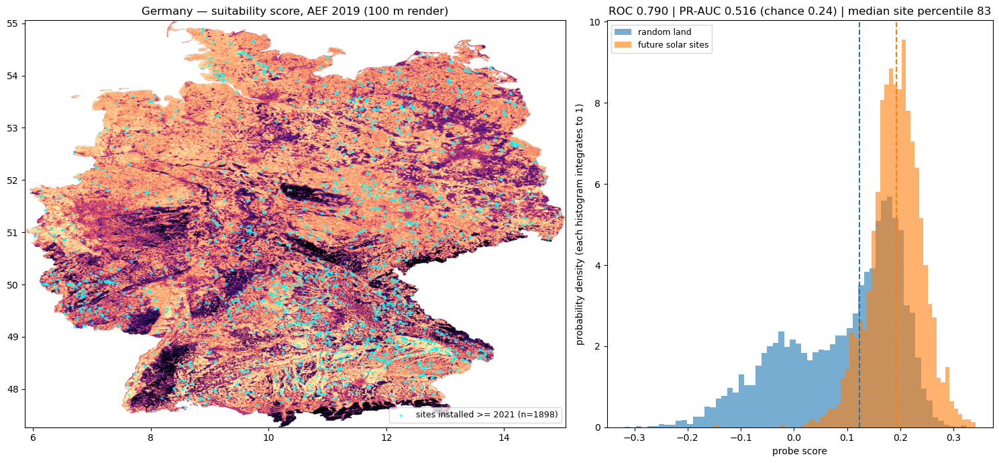

Germany 2019: ROC-AUC 0.790 | PR-AUC 0.516 vs chance 0.24 | median site pct 82.6 | top20% of scores captures 54.2% of sites | top10% of scores captures 36.5% of sites | top5% of scores captures 23.7% of sites


In [13]:
W2 = np.load("Solar-Siting/artifacts/models/emb_disc_weights_v2.npz")
country_results.append(
    country_scale("Germany", 2019, 2021, W2["w6_probe_masked_20"], "germany_probe20_2019"))

## 13 · Country-scale summary & where this leaves us

The table below is the headline deliverable of this notebook: a linear probe on AEF embeddings,
trained purely on chip data, transfers to ranking **every pixel of a country** it never saw at that
scale — with zero information about the validation sites (all post-date the imagery by ≥ 2 years).

In [14]:
summary = pd.DataFrame(country_results)
display(summary.round(2))
print('''
Takeaways
1. Chip-level scores transfer to country scale essentially undegraded (Greece 0.871 vs 0.864 held-out).
2. Difficulty is country-dependent: Greece >> Germany, driven by how much of the country is
   "plausible" land - motivates the biome/terrain sensitivity analysis.
3. The linear probe is converged (Section 11): next steps are the per-pixel MLP (nonlinearity),
   hard-negative mining from the top-scoring false-positive regions of these very maps
   (Epoch Blue recipe), and eventually the U-Net for spatial context.
''')

,country,year,probe,n_sites,ROC,PR,PR_chance,median_pct,top20%,top10%,top5%
0,Greece,2019,greece_probe_2019,1080,0.87,0.42,0.15,88.93,81.85,44.07,19.07
1,Germany,2019,germany_probe20_2019,1898,0.79,0.52,0.24,82.57,54.21,36.51,23.66



Takeaways
1. Chip-level scores transfer to country scale essentially undegraded (Greece 0.871 vs 0.864 held-out).
2. Difficulty is country-dependent: Greece >> Germany, driven by how much of the country is
   "plausible" land - motivates the biome/terrain sensitivity analysis.
3. The linear probe is converged (Section 11): next steps are the per-pixel MLP (nonlinearity),
   hard-negative mining from the top-scoring false-positive regions of these very maps
   (Epoch Blue recipe), and eventually the U-Net for spatial context.



## 14 · Model 2b — the per-pixel MLP: what does nonlinearity buy?

Section 11 showed the *linear* probe is capacity-bound: 4× more data moved nothing. The remaining
question for Model 2 is whether the ceiling is the **linearity** itself. A **multi-layer perceptron
(MLP)** answers it: instead of one weighted sum, we stack them — `64 → 256 → 256 → 1` — with a
**ReLU** after each hidden layer (ReLU(v) = max(0, v), which simply zeroes negatives). That kink is
what makes the model nonlinear: compositions of "weighted sum → kink" can bend the decision boundary
into curves, where the probe can only ever draw a flat plane in the 64-D embedding space. Dropout
(randomly silencing 20% of units during training) regularises; the loss is the same class-balanced
logistic loss as the probe's.

**This is a controlled experiment**: the MLP trains on the *exact same pixel rows* as the 5% masked
probe and is evaluated on the *exact same* saved held-out test samples — so any difference vs the
probe's 0.864 is attributable to nonlinearity alone, not to data.

**Result: pixel ROC 0.864 → 0.917, pixel PR-AUC 0.731 → 0.848.** Nonlinearity buys a lot — there is
substantial curved structure in AEF space that no linear scorer can express. Model 2's conclusions:

1. Linear probe: converged, capacity-bound (§11) — but already good enough to be useful at country
   scale (§10a/§12), and uniquely cheap to deploy (native GEE band sum).
2. MLP: +0.05 ROC / +0.12 PR over the probe for a 26-second GPU fit → clear green light for
   **Model 3 (U-Net)**, which adds spatial context on top of nonlinearity. Worth also rechecking the
   data question for the MLP later (unlike the probe, it may not be saturated at 5%).
3. Deployment trade-off: an MLP is no longer a weighted band sum, so country-scale maps mean
   exporting AEF tiles and running inference ourselves (fine on the JASMIN GPU) rather than a
   one-line GEE expression.

Two caveats. The training-time "val ROC 0.987" is optimistic — validation pixels come from the same
*scenes* as training pixels; the scene-level held-out 0.917 is the honest number (and that scene-level
discipline is exactly why we built the split that way). And for the chip-level row we feed the MLP the
chip's *mean embedding*: unlike a linear scorer, MLP(mean of pixels) ≠ mean of MLP(pixels), so the
chip numbers are indicative rather than exactly comparable to the pixel task.

In [15]:
import torch, torch.nn as nn
from sklearn.metrics import roc_auc_score, average_precision_score

class MLP(nn.Module):
    def __init__(self, d=64, h=256, p=0.2):
        super().__init__()
        self.net = nn.Sequential(nn.Linear(d, h), nn.ReLU(), nn.Dropout(p),
                                 nn.Linear(h, h), nn.ReLU(), nn.Dropout(p),
                                 nn.Linear(h, 1))
    def forward(self, x): return self.net(x).squeeze(-1)

MLP_PT  = "Solar-Siting/artifacts/models/mlp_masked_5pct.pt"
MLP_CSV = "Solar-Siting/artifacts/results/emb_disc_results_mlp.csv"
dev = "cuda" if torch.cuda.is_available() else "cpu"

if not (os.path.exists(MLP_PT) and os.path.exists(MLP_CSV)):
    # full training (~30 s on the A100): same pixels as the 5% probe, 10% val split for early stopping
    Xall = np.concatenate([z["res_pos_masked"], z["res_neg"]]).astype(np.float32)
    yall = np.concatenate([np.ones(len(z["res_pos_masked"])), np.zeros(len(z["res_neg"]))]).astype(np.float32)
    perm = np.random.default_rng(0).permutation(len(Xall)); Xall, yall = Xall[perm], yall[perm]
    n_val = int(0.1 * len(Xall))
    Xv, yv, Xt, yt = Xall[:n_val], yall[:n_val], Xall[n_val:], yall[n_val:]
    model = MLP().to(dev)
    lossf = nn.BCEWithLogitsLoss(pos_weight=torch.tensor((1 - yt.mean()) / yt.mean(), device=dev))
    opt = torch.optim.Adam(model.parameters(), lr=1e-3)
    Xt_t, yt_t = torch.from_numpy(Xt), torch.from_numpy(yt)
    Xv_t = torch.from_numpy(Xv).to(dev)
    best_auc, best_state = 0, None
    for ep in range(12):
        model.train(); order = torch.randperm(len(Xt_t))
        for i in range(0, len(Xt_t), 16384):
            idx = order[i:i+16384]
            opt.zero_grad()
            loss = lossf(model(Xt_t[idx].to(dev)), yt_t[idx].to(dev))
            loss.backward(); opt.step()
        model.eval()
        with torch.no_grad():
            auc = roc_auc_score(yv, model(Xv_t).cpu().numpy())
        print(f"epoch {ep+1:2d} | val ROC {auc:.4f}", flush=True)
        if auc > best_auc: best_auc, best_state = auc, {k: v.cpu().clone() for k, v in model.state_dict().items()}
    torch.save(best_state, MLP_PT)
    model.load_state_dict(best_state)
    T2 = np.load("Solar-Siting/artifacts/stats/emb_disc_testsamples.npz")
    def _sc(A, bs=262144):
        with torch.no_grad():
            return np.concatenate([model(torch.from_numpy(A[i:i+bs].astype(np.float32)).to(dev)).cpu().numpy()
                                   for i in range(0, len(A), bs)])
    s_sol, s_neg, s_mp, s_mn = _sc(T2["X_sol"]), _sc(T2["X_neg"]), _sc(T2["M_pos"]), _sc(T2["M_neg"])
    y1, x1 = np.r_[np.ones(len(s_sol)), np.zeros(len(s_neg))], np.r_[s_sol, s_neg]
    y2, x2 = np.r_[np.ones(len(s_mp)), np.zeros(len(s_mn))], np.r_[s_mp, s_mn]
    pd.DataFrame([dict(scorer="mlp_masked_5pct",
        px_ROC=roc_auc_score(y1, x1), px_PR=average_precision_score(y1, x1),
        chip_ROC=roc_auc_score(y2, x2), chip_PR=average_precision_score(y2, x2))]).to_csv(MLP_CSV, index=False)

mlp_res = pd.read_csv(MLP_CSV)
lin_res = pd.read_csv("Solar-Siting/artifacts/results/emb_disc_results.csv")
final = pd.concat([lin_res[lin_res.scorer.isin(["w1_cosine_proto", "w6_probe_masked", "w7_probe_whole"])]
                   .drop(columns=["within_ROC"]), mlp_res], ignore_index=True)
print("Model 2 final ladder (held-out, scene-level test; px PR baseline 0.32, chip PR baseline 0.43):")
display(final.round(3))
print("\nnonlinearity gain over the linear probe: "
      f"px ROC +{mlp_res.px_ROC[0]-0.864:.3f}, px PR +{mlp_res.px_PR[0]-0.730:.3f} "
      "-> green light for Model 3 (U-Net: nonlinearity + spatial context)")

Model 2 final ladder (held-out, scene-level test; px PR baseline 0.32, chip PR baseline 0.43):


,scorer,px_ROC,px_PR,chip_ROC,chip_PR
0,w1_cosine_proto,0.734,0.552,0.667,0.570
1,w6_probe_masked,0.864,0.731,0.813,0.743
2,w7_probe_whole,0.813,0.647,0.841,0.778
3,mlp_masked_5pct,0.917,0.848,0.883,0.847



nonlinearity gain over the linear probe: px ROC +0.053, px PR +0.118 -> green light for Model 3 (U-Net: nonlinearity + spatial context)


## 15 · Rapid country-scale analysis: is the linear probe the ceiling?

The linear probe matters beyond its accuracy: it runs **natively in Earth Engine** as a weighted
band sum, so a whole country can be mapped in seconds without downloading a single image. That is
the workflow a planner would actually use. So before optimising slower models, we asked: **out of
everything deployable inside GEE (the only platform hosting AlphaEarth), is linear the best we can
do?** The GEE-native menu:

| family | GEE mechanism |
|---|---|
| linear scorers (our probe) | weighted band sum — also the canonical GeoFM-evaluation method |
| **tree ensembles** | `ee.Classifier.decisionTreeEnsemble` — a locally-trained sklearn forest converted to tree strings (`geemap.ml`) and injected; industry standard for GEE land classification |
| quadratic scorer (QDA) | array-image matrix ops; free to build from our full-data streaming moments |
| random Fourier features | fixed `cos(Wx+b)` band math + weighted sum ≈ an RBF-kernel model |
| gradient boosting | `smileGradientTreeBoost`, but training must happen GEE-side (upload pixels as a table) |

**Bake-off protocol** (same discipline as the MLP): identical training pixels to the 5% probe,
hyper-parameters chosen on a validation split *of training pixels*, final numbers on the untouched
scene-level held-out test set. Results below; three lessons:

1. **The linear question is closed.** The C-sweep moved validation ROC by 0.0003, and the LDA built
   from *all* 434M training pixels ties the 5% probe — 0.864 is what a flat plane gives, full stop.
2. **QDA underperforms (0.811)** despite using full-data covariances. Instructive: §6's "signal
   lives in covariance" meant the discriminative *direction* isn't the mean-difference direction —
   not that each class is one Gaussian. 431M negative pixels spanning every biome are wildly
   multimodal, and QDA pays for assuming otherwise. Discriminative learners make no such assumption.
3. **Trees close most of the gap to the MLP.** Gradient boosting hits 0.914 (MLP: 0.917), and a
   random forest 0.900 — with the unique advantage of the *turnkey* deployment path (no GEE-side
   retraining, no image download).

**Deployment sizing:** GEE caps the size of an injected classifier (~10 MB per request), so the
forest must be compact. A 30-tree, depth-12 forest keeps px ROC 0.891 (vs 0.900 full-size) at
5.4 MB — it fits directly.

**End-to-end Greece test (paired: the exact same 1,080 site + 6,000 random points as §10a):** the
RF ties the probe on ROC (0.873 vs 0.871) but **wins where a planner lives — the top of the
ranking**: at a 5% land-search budget it captures 26.5% of future sites vs the probe's 19.1%
(+39% relative), and 49.6% vs 44.1% at 10%. Country-scale "site vs random land" is dominated by
easy discriminations (mountains/forest/water) that a plane already handles; the RF's nonlinearity
pays off in the hard calls near the top — exactly the shortlisting regime. Its probability output
is also cleanly bimodal (sites pile up at 0.6–0.9), much nicer to threshold than the probe's
overlapping score distributions.

**Verdict for the rapid-analysis product:** ship the **RF-30 tree ensemble** as the default rapid
scorer (same instant workflow, better shortlists), keep the **probe** as the simplest/interpretable
artifact (65 numbers, one line of GEE), and note that anything better (MLP/U-Net) leaves the
GEE-native family — those become **precomputed score layers**: run once per AEF year on the JASMIN
GPU, ingest into GEE as a tiled asset, and a planner browses them instantly anyway. A real tool
would ship both patterns: precomputed layers for browsing + the native scorer for "re-run with any
year / region / retrained weights".

GEE-deployable scorer bake-off (held-out, scene-level; reference MLP 0.917/0.848 px, not GEE-native):


,scorer,px_ROC,px_PR,chip_ROC,chip_PR,fit_s,gee
0,probe_C0.3,0.864,0.731,0.814,0.744,16.7,band sum
1,qda_fullmoments_e0.0001,0.811,0.627,0.726,0.616,0.5,array matmul
2,rf_d14_100t,0.900,0.803,0.856,0.800,76.6,decisionTreeEnsemble
3,histgb_400,0.914,0.840,0.875,0.837,31.5,smileGTB (GEE-side train)
4,rff512_g0.27,0.897,0.794,0.858,0.805,101.2,cos band math



Greece 2019 paired comparison (identical validation points; topX = % of future sites in top X% of scores):


,scorer,ROC,median_site_pct,top20,top10,top5
0,linear probe (band sum),0.871,88.933,81.852,44.074,19.074
1,RF-30 (decisionTreeEnsemble),0.873,89.908,80.185,49.630,26.481


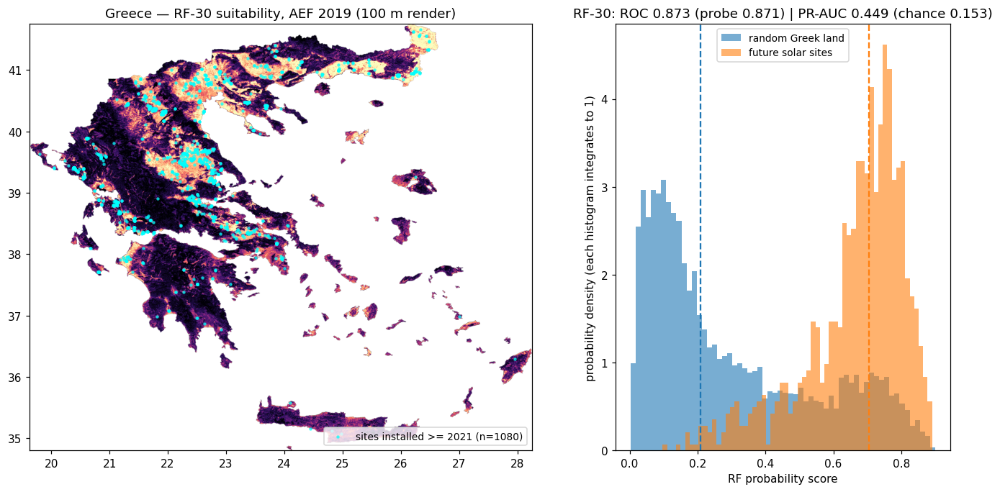

In [16]:
# cache-loading cell: reads the bake-off + paired-Greece artifacts (recompute scripts live in
# the session scratchpad; the bake-off itself takes ~8 min, the Greece RF deployment ~8 min)
bake = pd.read_csv("Solar-Siting/artifacts/results/emb_disc_bakeoff.csv")
print("GEE-deployable scorer bake-off (held-out, scene-level; reference MLP 0.917/0.848 px, not GEE-native):")
display(bake.round(3))

from sklearn.metrics import roc_auc_score
G_rf = np.load("Solar-Siting/artifacts/country/greece_rf30_2019_scores.npz")
G_pr = np.load("Solar-Siting/artifacts/country/greece_probe_2019_scores.npz")
def country_metrics(ss, rs):
    auc = roc_auc_score(np.r_[np.ones(len(ss)), np.zeros(len(rs))], np.r_[ss, rs])
    pct = np.array([(rs < s).mean() for s in ss])
    return dict(ROC=auc, median_site_pct=np.median(pct)*100,
                top20=(pct>=0.8).mean()*100, top10=(pct>=0.9).mean()*100, top5=(pct>=0.95).mean()*100)
paired = pd.DataFrame([
    dict(scorer="linear probe (band sum)", **country_metrics(G_pr["site_s"], G_pr["rand_s"])),
    dict(scorer="RF-30 (decisionTreeEnsemble)", **country_metrics(G_rf["site_s"], G_rf["rand_s"]))])
print("\nGreece 2019 paired comparison (identical validation points; topX = % of future sites in top X% of scores):")
display(paired.round(3))

from IPython.display import Image as IPyImage
display(IPyImage(filename="Solar-Siting/artifacts/country/greece_rf30_2019_fig.png", width=950))

## 16 · Optimising the MLP: data scaling and architecture — the per-pixel ceiling

§14 left two open questions: unlike the probe, the MLP might not be saturated at the 5% pixel
sample, and we never tuned its architecture. This sweep answers both. We extracted an **18× larger
training pool** (6.2M solar px from 6,000 scenes — twice the scene diversity — plus 23.7M negative
px; ~30M rows, same 0.21 positive share) and ran six configurations under the usual discipline:
selection by validation ROC only, every row reported on the same untouched scene-level test set.

- **A** — original row count (1.6M) but drawn from 2× as many scenes → isolates *diversity* from *volume*
- **B, C** — 4× and 18× rows, identical architecture to §14 → the data-scaling curve
- **D, E, F** — wider (512), deeper (3 layers), both, at full data → architecture headroom

**Result: the per-pixel MLP is saturated too.** Every configuration lands at px ROC 0.917–0.921,
px PR 0.840–0.849 — statistically indistinguishable from the §14 baseline (0.917/0.848). Eighteen
times more data: nothing. Double the width, an extra layer: nothing. Three conclusions:

1. **~0.92 ROC / ~0.85 PR is the information ceiling of a single 10 m AEF pixel** for this task.
   Model 2 has now extracted essentially everything a pixel-independent scorer can, linear or not.
   Whatever separates the remaining errors is not visible in one embedding vector alone.
2. The **chip-level task did creep up with more data** (chip ROC 0.883 → 0.889–0.893, PR 0.847 →
   0.853–0.857) — scene-mean embeddings are a slightly different distribution from training pixels,
   and more diverse training helps there marginally. F (wide+deep) is best for scene ranking.
3. The **validation-vs-test gap became a chasm** (val ROC 1.0000 vs test 0.918 for the big runs):
   with 30M pixels the network can effectively memorise its training *scenes*, and same-scene
   validation pixels become trivially easy. This is the cleanest demonstration yet of why our
   scene-level held-out split is the only number to trust.

**Where the next gains must come from** (in expected order of impact): **spatial context** —
Model 3's U-Net sees the neighbourhood, not one pixel (and §14 showed nonlinearity alone is worth
+0.05; context is the remaining lever); **label quality** — the 3-class mask rebuild (§2's
contamination findings) removes wrongly-labelled "background" that likely bounds this ceiling; and
**hard-negative mining** — retraining with false positives harvested from the country maps.
Model 2 is closed: the deployable ladder ends at RF-30 for rapid GEE analysis (§15), and per-pixel
accuracy ends here at ~0.92.

MLP sweep (held-out, scene-level test; probe reference 0.864/0.731):


,config,rows,width,depth,val_ROC,px_ROC,px_PR,chip_ROC,chip_PR,train_s
0,baseline_5pct (§14),1637318,256,2,0.987,0.917,0.848,0.883,0.847,26
1,A_1x_diverse,1637318,256,2,0.986,0.921,0.840,0.872,0.811,20
2,B_4x,6549272,256,2,0.996,0.920,0.843,0.881,0.830,69
3,C_18x_full,29910927,256,2,0.999,0.917,0.845,0.889,0.855,308
4,D_18x_w512,29910927,512,2,1.000,0.920,0.849,0.889,0.853,724
5,E_18x_d3,29910927,256,3,1.000,0.921,0.848,0.889,0.853,458
6,F_18x_w512d3,29910927,512,3,1.000,0.918,0.845,0.893,0.857,1076


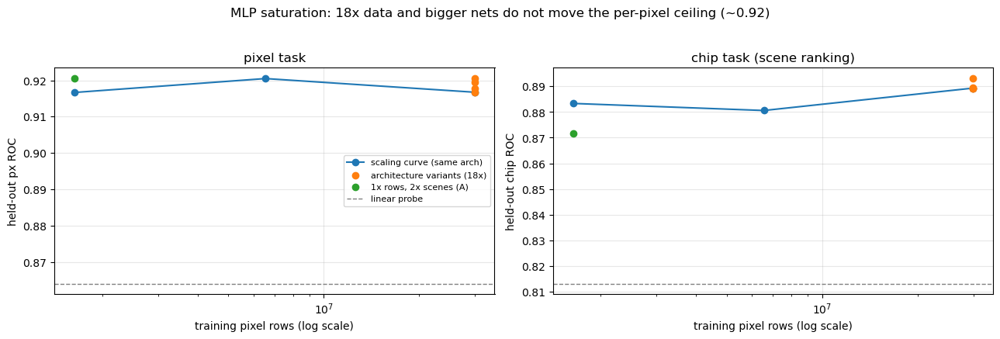

pixel task: every config within ±0.004 of baseline -> single-pixel information ceiling reached
chip task: modest gain with data/size (0.883 -> 0.893) -> scene ranking still benefits slightly
val ROC 1.0000 vs test 0.918 on the 18x runs -> same-scene validation is meaningless; trust only the scene-level held-out numbers


In [17]:
# cache-loading cell: sweep results (recompute script: session scratchpad sweep_mlp.py, ~40 min on the A100)
sweep = pd.read_csv("Solar-Siting/artifacts/results/emb_disc_mlp_sweep.csv")
base = pd.read_csv("Solar-Siting/artifacts/results/emb_disc_results_mlp.csv")
base_row = dict(config="baseline_5pct (§14)", rows=1637318, width=256, depth=2, val_ROC=0.9871,
                px_ROC=base.px_ROC[0], px_PR=base.px_PR[0],
                chip_ROC=base.chip_ROC[0], chip_PR=base.chip_PR[0], train_s=26)
tbl = pd.concat([pd.DataFrame([base_row]), sweep], ignore_index=True)
print("MLP sweep (held-out, scene-level test; probe reference 0.864/0.731):")
display(tbl.round(3))

fig, axes = plt.subplots(1, 2, figsize=(13, 4.2))
curve = tbl[tbl.config.isin(["baseline_5pct (§14)", "B_4x", "C_18x_full"])]
for ax, col, title in [(axes[0], "px_ROC", "pixel task"), (axes[1], "chip_ROC", "chip task (scene ranking)")]:
    ax.semilogx(curve.rows, curve[col], "o-", label="scaling curve (same arch)")
    ax.scatter(tbl.rows[3:], tbl[col][3:], c="C1", zorder=3, label="architecture variants (18x)")
    ax.scatter(tbl.rows[1], tbl[col][1], c="C2", zorder=3, label="1x rows, 2x scenes (A)")
    ax.axhline(0.864 if col == "px_ROC" else 0.813, ls="--", c="gray", lw=1, label="linear probe")
    ax.set_xlabel("training pixel rows (log scale)"); ax.set_ylabel(f"held-out {col.replace('_',' ')}")
    ax.set_title(title); ax.grid(alpha=0.3)
axes[0].legend(fontsize=8, loc="center right")
plt.suptitle("MLP saturation: 18x data and bigger nets do not move the per-pixel ceiling (~0.92)", y=1.03)
plt.tight_layout(); plt.show()

print("pixel task: every config within ±0.004 of baseline -> single-pixel information ceiling reached")
print("chip task: modest gain with data/size (0.883 -> 0.893) -> scene ranking still benefits slightly")
print("val ROC 1.0000 vs test 0.918 on the 18x runs -> same-scene validation is meaningless; "
      "trust only the scene-level held-out numbers")

## 17 · Visual check — does the MLP's per-pixel map line up with the masks?

All MLP numbers so far are AUCs over pixel collections; this section looks at the model the way it
would actually be used at *regional* scale: score every pixel of a chip and eyeball the heatmap
against the ground-truth mask (cyan outline = pixels that became solar ~2 years later). Layout per
row: the chip's pseudo-RGB embedding rendering, the linear probe's score map (for comparison), and
the MLP's probability map on a fixed 0–1 scale. The last row is a held-out true-negative chip —
there the whole map should sit low.

Two things to keep in mind while reading these. **The mask is not the target.** The model is asked
"could this pixel become solar?", not "will it?" — land right next to a future site is often just as
suitable (that was the §7 within-chip finding, and the whole background-is-context position), so a
good map shows the mask *inside* a broader warm region of similar land, not a pixel-perfect cutout
of it. What should NOT be warm: forest, water, steep or built-up ground. And **the numbers under
each title** give the chip's mean MLP probability inside vs outside the mask — a quick per-chip
sanity check that the ordering is right even when the background runs warm.

/tmp/ipykernel_883/2645133226.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mlp.load_state_dict(torch.load("Solar-Siting/artifacts/models/mlp_masked_5pct.pt",


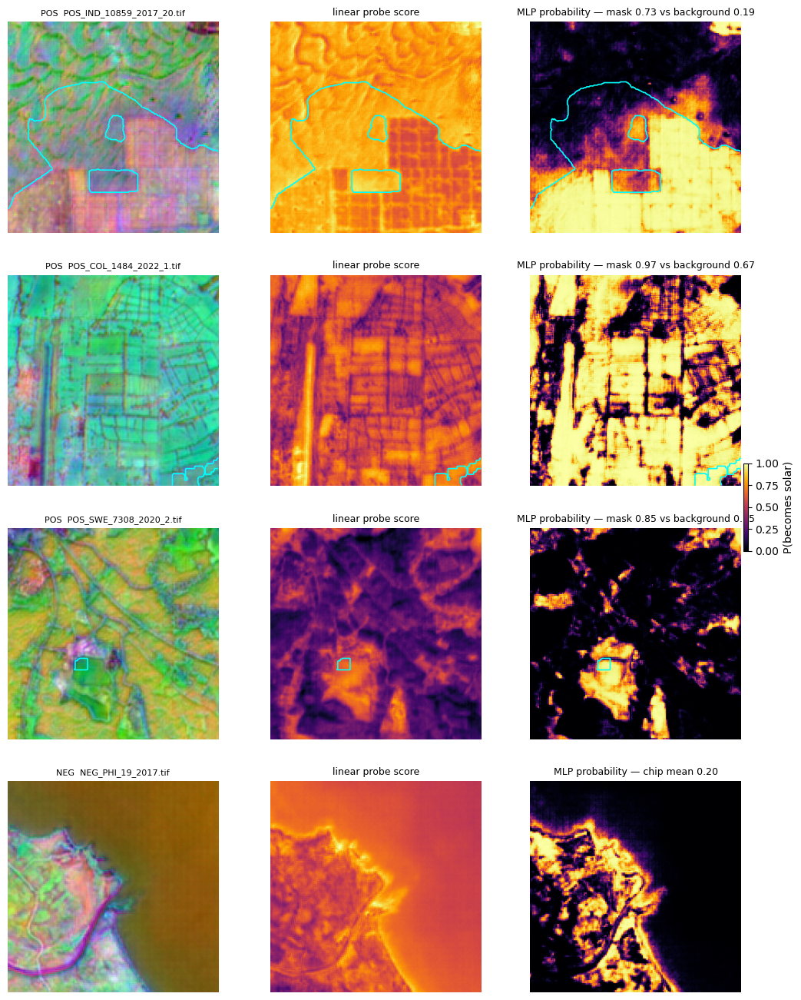

In [18]:
import torch
mlp = MLP()                                            # class defined in §14
mlp.load_state_dict(torch.load("Solar-Siting/artifacts/models/mlp_masked_5pct.pt",
                               map_location="cpu"))
mlp.eval()

def mlp_prob_map(arr):
    "arr (64,H,W) -> per-pixel MLP probability (H,W); NaN pixels stay NaN"
    flat = arr.reshape(64, -1).T
    ok = np.isfinite(flat).all(axis=1)
    out = np.full(len(flat), np.nan, np.float32)
    with torch.no_grad():
        out[ok] = torch.sigmoid(mlp(torch.from_numpy(flat[ok]))).numpy()
    return out.reshape(arr.shape[1:])

# a spread of held-out chips: the sanity chip + two other countries + one true negative
rng_pick = np.random.default_rng(3)
others = (pos_test[pos_test.chip != SANITY].groupby("country", group_keys=False)
          .apply(lambda g: g.sample(1, random_state=3)).sample(2, random_state=3).chip.tolist())
panels = [(SANITY, False)] + [(c, False) for c in others] + [(neg_test.sample(1, random_state=5).file.iloc[0], True)]

w6 = W["w6_probe_masked"]
lim6 = np.percentile(np.r_[X_sol @ w6, X_neg @ w6], [2, 98])

fig, axes = plt.subplots(len(panels), 3, figsize=(12.5, 4.1 * len(panels)))
for i, (fn, is_neg) in enumerate(panels):
    arr, sc6, msk = score_map(fn, w6, is_neg)          # helper from §8
    prob = mlp_prob_map(arr)
    axes[i, 0].imshow(pseudo_rgb(arr))
    axes[i, 1].imshow(sc6, cmap="inferno", vmin=lim6[0], vmax=lim6[1])
    im = axes[i, 2].imshow(prob, cmap="inferno", vmin=0, vmax=1)
    if msk is not None:
        for ax in axes[i]:
            ax.contour(msk, levels=[0.5], colors="cyan", linewidths=1.2)
        m_in, m_out = np.nanmean(prob[msk > 0]), np.nanmean(prob[msk == 0])
        axes[i, 2].set_title(f"MLP probability — mask {m_in:.2f} vs background {m_out:.2f}", fontsize=9)
    else:
        axes[i, 2].set_title(f"MLP probability — chip mean {np.nanmean(prob):.2f}", fontsize=9)
    axes[i, 0].set_title(("NEG  " if is_neg else "POS  ") + fn, fontsize=8)
    axes[i, 1].set_title("linear probe score", fontsize=9)
    for ax in axes[i]: ax.axis("off")
fig.colorbar(im, ax=axes[:, 2], fraction=0.02, pad=0.01, label="P(becomes solar)")
plt.show()

## 18 · The deployed scorer, finished: full-coverage RF and two more countries

§15 shipped RF-30 trained on the 5% pixel sample. Two questions remained: would more data help the
*forest* (the probe and MLP were saturated, but the RF was not yet at the tree-family ceiling), and
does the result hold beyond Greece? Both answered here.

**Full-coverage retrain.** A new extraction took solar pixels from **every positive training chip**
(65,985 chips, 131 countries, all install years; ~6.2M solar px) plus the full 23.7M-px negative
pool — maximum country/year coverage rather than a deeper sample of fewer scenes. Unlike the probe
and MLP, **the RF did improve: px ROC 0.891 → 0.901, PR 0.784 → 0.799** at identical deployable
size (5.3 MB). A fixed-size forest isn't capacity-bound the way the probe is — better data sharpens
every split — so "train on as much coverage as possible" is the right recipe for the deployed model.
(The big non-deployable reference forest reached 0.916, essentially the gradient-boosting/MLP
ceiling; our compact model gives up ~0.015 ROC for GEE-nativeness.)

**Two more countries, one command each.** The runs below were produced by the reusable CLI added to
the repo — `python Solar-Siting/run_country_rf.py <Country> [--year 2019 ...]` — which injects the
saved forest into GEE, validates against inventory sites installed ≥ year+2 (i.e. not yet existing
in the scored imagery), and renders the national map with those sites overlaid:

* **Germany** — ROC **0.830**, top 20/10/5% of ranked land captures **64.6 / 44.7 / 31.7%** of
  1,898 future sites. The probe managed 0.790 and 54% at top-20%: the forest's nonlinearity helps
  most exactly where the probe struggled (uniform agricultural land).
* **China** — ROC **0.895**, median future site sits at the **93.6th percentile** of Chinese land,
  and the top 20/10/5% captures **84.4 / 64.7 / 43.9%** of 3,000 validation sites (sampled from
  16,074 post-2021 installs). A structurally different solar market, same map quality as Greece.

Caveats carried forward: random-land points are not confirmed non-solar (some "false positives" are
genuinely suitable undeveloped land), and validation sites are not yet filtered against the global
training sample (a few % overlap possible — under discussion; see §10a). Cross-country pattern so
far — Greece 0.87, Germany 0.83, China 0.90 — suggests difficulty tracks how uniformly suitable a
country's land is, motivating a broader biome/terrain sensitivity sweep as future work.

RF data-scaling (held-out px, scene-level test):


,model,px_ROC,px_PR
0,rf30_5pct_sample,0.891,0.784
1,rf30_coverage,0.901,0.799
2,rf100_coverage_8M,0.916,0.829



country-scale summary (topX = % of future sites in the top X% of ranked land):


,run,ROC,median_site_pct,top20,top10,top5
0,Germany (RF-30 coverage),0.830,87.600,64.647,44.731,31.718
1,China (RF-30 coverage),0.895,93.617,84.447,64.730,43.870
2,"Germany (probe, §12)",0.790,82.567,54.215,36.512,23.656
3,"Greece (RF-30 5%, §15)",0.873,89.908,80.185,49.630,26.481


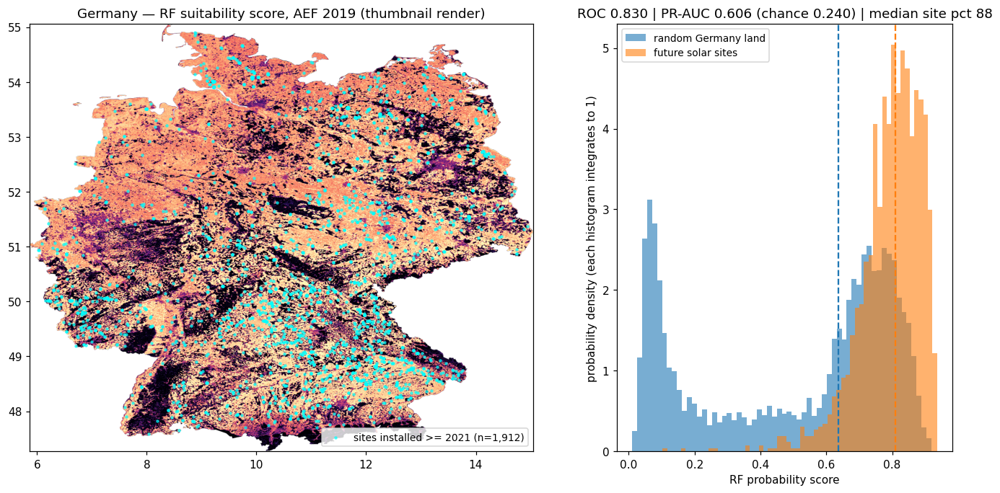

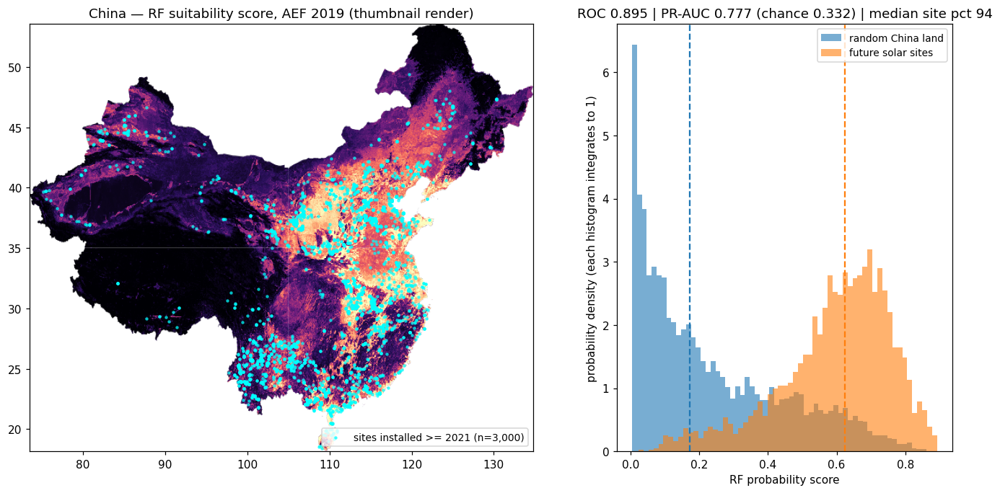

In [19]:
# cache-loading cell: coverage-retrain results + both country runs (produced by
# Solar-Siting/run_country_rf.py; see §18 markdown for usage)
cov = pd.read_csv("Solar-Siting/artifacts/results/emb_disc_rf_coverage.csv")
print("RF data-scaling (held-out px, scene-level test):")
display(cov.round(3))

runs = [("Germany (RF-30 coverage)", "Solar-Siting/artifacts/country/germany_rf_2019_scores.npz"),
        ("China (RF-30 coverage)",   "Solar-Siting/artifacts/country/china_rf_2019_scores.npz"),
        ("Germany (probe, §12)",     "Solar-Siting/artifacts/country/germany_probe20_2019_scores.npz"),
        ("Greece (RF-30 5%, §15)",   "Solar-Siting/artifacts/country/greece_rf30_2019_scores.npz")]
rows = []
for name, p in runs:
    if not os.path.exists(p):
        print("missing:", p); continue
    z = np.load(p)
    rows.append(dict(run=name, **country_metrics(z["site_s"], z["rand_s"])))   # §15 helper
print("\ncountry-scale summary (topX = % of future sites in the top X% of ranked land):")
display(pd.DataFrame(rows).round(3))

from IPython.display import Image as IPyImage
for f in ["germany_rf_2019_fig.png", "china_rf_2019_fig.png"]:
    p = f"Solar-Siting/artifacts/country/{f}"
    if os.path.exists(p):
        display(IPyImage(filename=p, width=950))
    else:
        print("figure not rendered (thumbnail failed for this country):", f)